# Image Processing with OpenCV

<img src="opencv.svg" width="200" height="200">

In [1]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

In [2]:
plt.style.use('ggplot')

## Load Image

In [3]:
img_dog = cv2.imread("dog.jpg")
img_dog.shape

(427, 640, 3)

In [4]:
type(img_dog)

numpy.ndarray

In [5]:
img_dog.max()

255

In [6]:
img_dog.min()

0

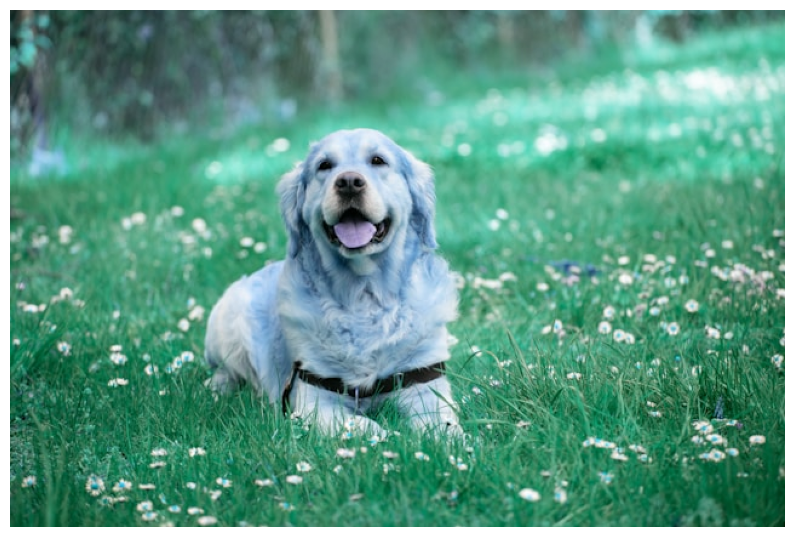

In [7]:
fig, ax = plt.subplots(figsize=(10, 10))
ax.imshow(img_dog)
ax.axis('off')
plt.show()

The image looks odd because the order of RGB channels is wrong. `cv2` reads in channels as BGR. We can fix this using the `cvtColor` function to convert the image to a different color space where the channels are in the correct order.

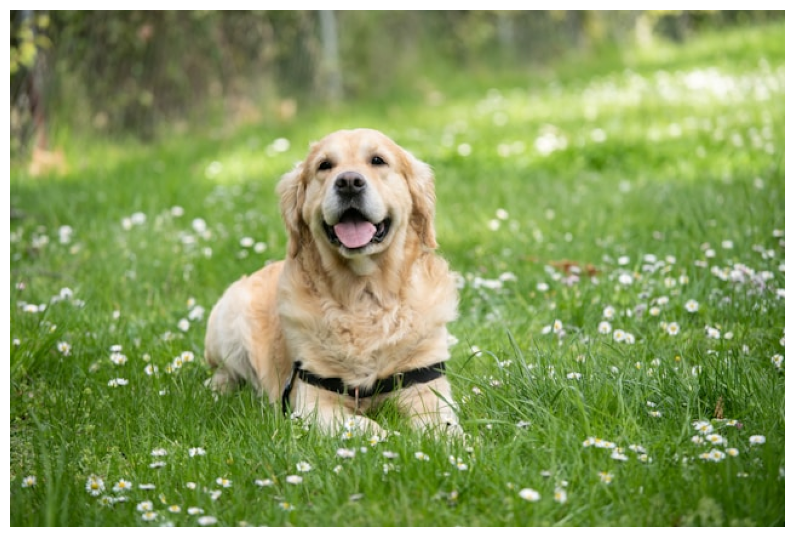

In [8]:
fig, ax = plt.subplots(figsize=(10, 10))
ax.imshow(cv2.cvtColor(img_dog, cv2.COLOR_BGR2RGB))
ax.axis('off')
plt.show()

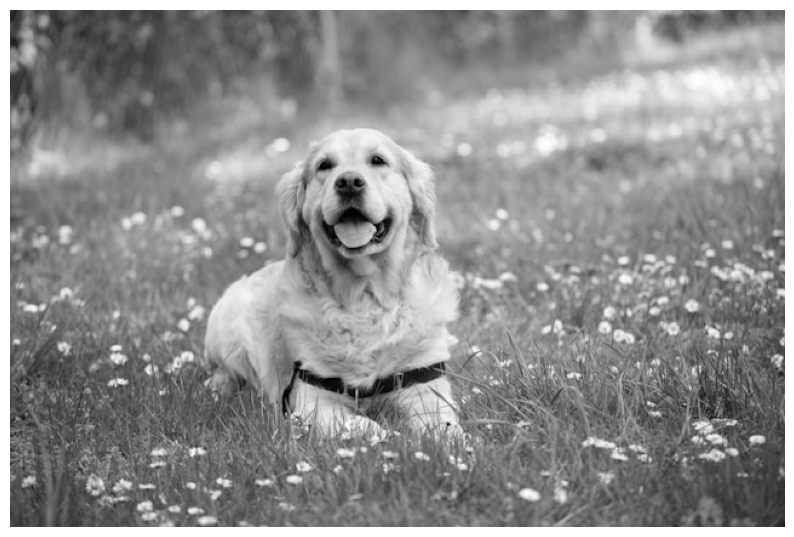

In [9]:
# Display image in grayscale
fig, ax = plt.subplots(figsize=(10, 10))
ax.imshow(cv2.cvtColor(img_dog, cv2.COLOR_BGR2GRAY), cmap='gray')
ax.axis('off')
plt.show()

In [10]:
# Save image
cv2.imwrite('dog_gray.jpg', cv2.cvtColor(img_dog, cv2.COLOR_BGR2GRAY))

True

## Image Channels

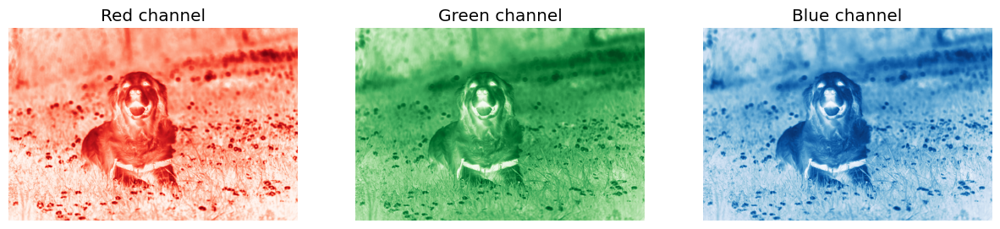

In [11]:
# Display RGB Channels of the image
fig, axs = plt.subplots(1, 3, figsize=(15, 5))
axs[0].imshow(img_dog[:,:,0], cmap='Reds')
axs[1].imshow(img_dog[:,:,1], cmap='Greens')
axs[2].imshow(img_dog[:,:,2], cmap='Blues')
axs[0].axis('off')
axs[1].axis('off')
axs[2].axis('off')
axs[0].set_title('Red channel')
axs[1].set_title('Green channel')
axs[2].set_title('Blue channel')
plt.show()

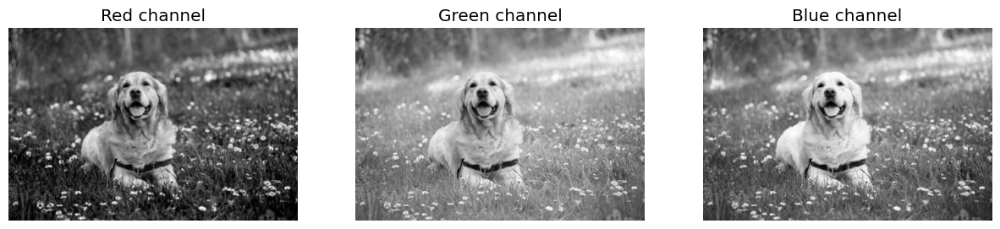

In [12]:
# Display RGB Channels of the image in grayscale to see that regions with higher intensity values for each channel.
fig, axs = plt.subplots(1, 3, figsize=(15, 5))
axs[0].imshow(img_dog[:,:,0], cmap='gray')
axs[1].imshow(img_dog[:,:,1], cmap='gray')
axs[2].imshow(img_dog[:,:,2], cmap='gray')
axs[0].axis('off')
axs[1].axis('off')
axs[2].axis('off')
axs[0].set_title('Red channel')
axs[1].set_title('Green channel')
axs[2].set_title('Blue channel')
plt.show()

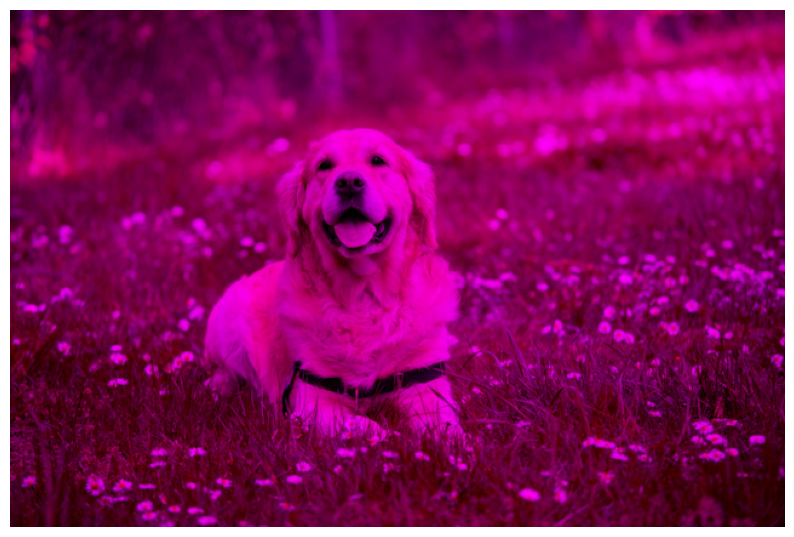

In [13]:
# Remove the green channel from the image and keep the red and blue channels
dog_RB = img_dog.copy()
dog_RB[:, :, 1] = 0

fig, ax = plt.subplots(figsize=(10, 10))
ax.imshow(cv2.cvtColor(dog_RB, cv2.COLOR_BGR2RGB))
ax.axis('off')
plt.show()

## Indexing

In [14]:
half_rows = round(img_dog.shape[0]/2)
half_rows

214

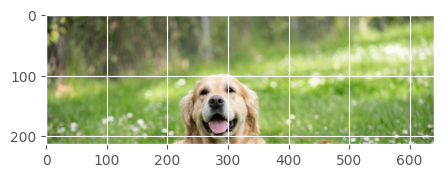

In [15]:
# Show firt 214 rows
fig, ax = plt.subplots(figsize=(5, 5))
ax.imshow(cv2.cvtColor(img_dog[0:half_rows,:,:], cv2.COLOR_BGR2RGB))
plt.show()

In [16]:
half_cols = round(img_dog.shape[1]/2)
half_cols

320

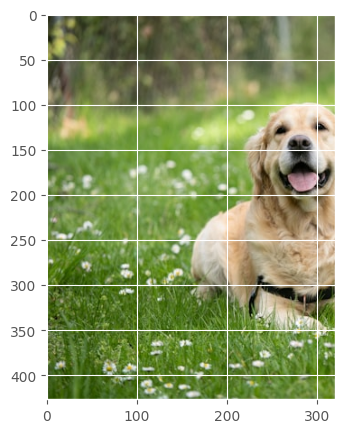

In [17]:
# Show first 320 columns
fig, ax = plt.subplots(figsize=(5, 5))
ax.imshow(cv2.cvtColor(img_dog[:,0:half_cols,:], cv2.COLOR_BGR2RGB))
plt.show()

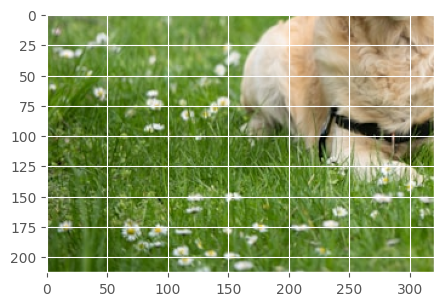

In [18]:
fig, ax = plt.subplots(figsize=(5, 5))
ax.imshow(cv2.cvtColor(img_dog[half_rows:, 0:half_cols, :], cv2.COLOR_BGR2RGB))
plt.show()

## Image Manipulation

### Flipping
* `cv2.flip(image, 1)` flips the image horizontally.
* `cv2.flip(image, 0)` flips the image vertically.
* `cv2.flip(image, -1)` flips the image both horizontally and vertically

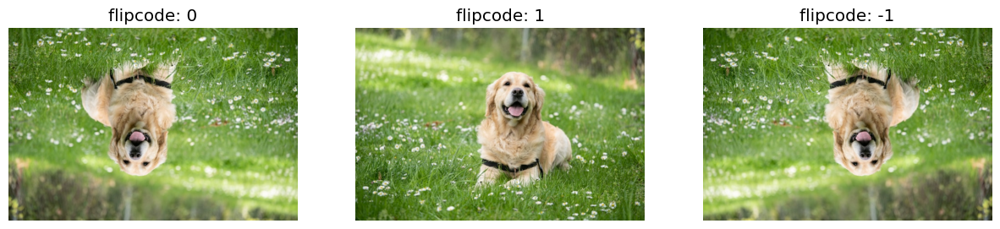

In [19]:
fig, axs = plt.subplots(1, 3, figsize=(15, 5))
for i, flipcode in enumerate([0, 1, -1]):
    im_flip = cv2.flip(img_dog, flipcode)
    axs[i].imshow(cv2.cvtColor(im_flip,cv2.COLOR_BGR2RGB))
    axs[i].set_title("flipcode: "+str(flipcode))
    axs[i].axis('off')
plt.show()

### Rotation

- `cv2.ROTATE_90_CLOCKWISE`: Represents a 90-degree clockwise rotation.
- `cv2.ROTATE_90_COUNTERCLOCKWISE`: Represents a 90-degree counterclockwise rotation.
- `cv2.ROTATE_180`: Represents a 180-degree rotation.

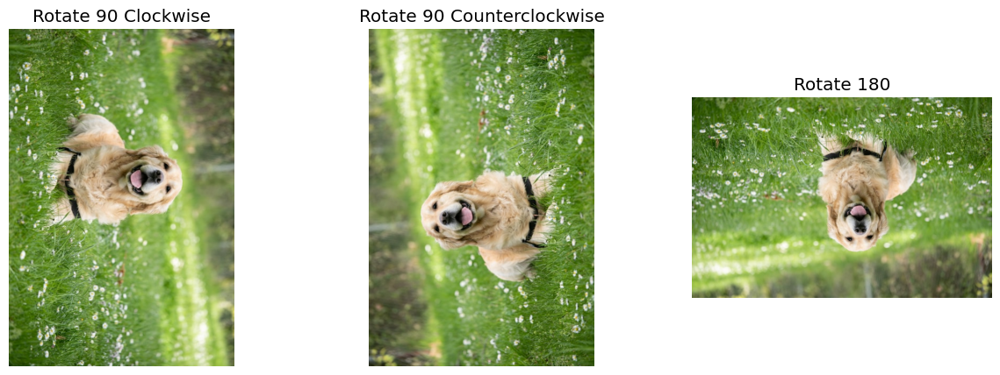

In [20]:
fig, axs = plt.subplots(1, 3, figsize=(15, 5))

rotations = {
    cv2.ROTATE_90_CLOCKWISE: 'Rotate 90 Clockwise',
    cv2.ROTATE_90_COUNTERCLOCKWISE: 'Rotate 90 Counterclockwise',
    cv2.ROTATE_180: 'Rotate 180'
}

for i, (key, value) in enumerate(rotations.items()):
    axs[i].imshow(cv2.cvtColor(cv2.rotate(img_dog, key), cv2.COLOR_BGR2RGB))
    axs[i].set_title(value)
    axs[i].axis('off')
plt.show()

### Cropping and Drawing
I would like to crop the image to focus on the dog's face

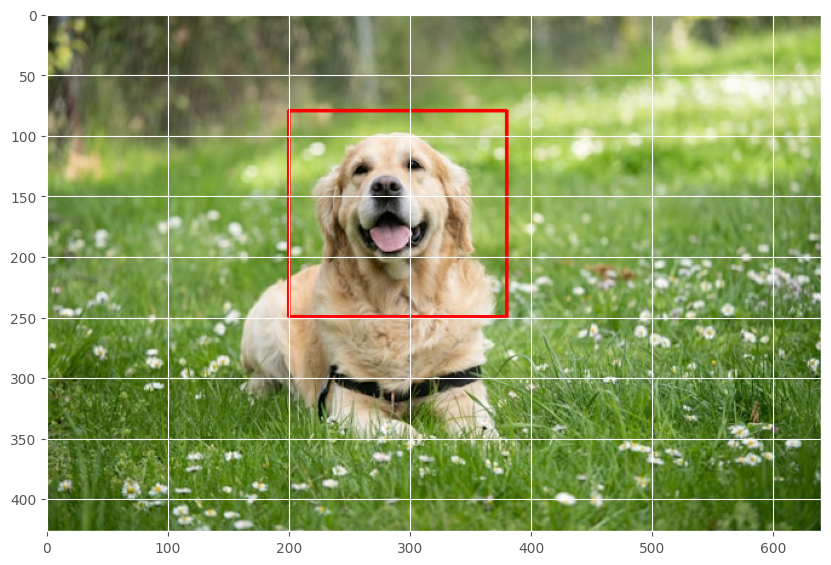

In [21]:
# Draw a square around the dog's face
left, right, top, bottom = 200, 380, 80, 250

img_draw = np.copy(img_dog)
cv2.rectangle(img_draw, pt1=(left, top), pt2=(right, bottom), color=(0, 0, 255), thickness=2) 

fig, ax = plt.subplots(figsize=(10, 10))
ax.imshow(cv2.cvtColor(img_draw, cv2.COLOR_BGR2RGB))
plt.show()

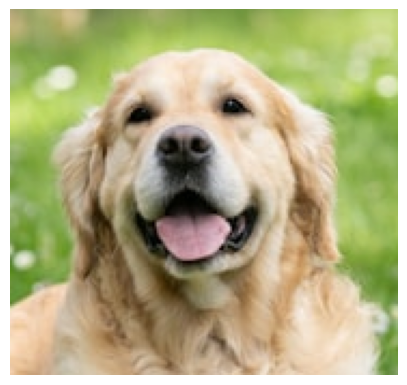

In [22]:
# Cropping
fig, ax = plt.subplots(figsize=(5, 5))
ax.imshow(cv2.cvtColor(img_dog[top:bottom, left:right, :], cv2.COLOR_BGR2RGB))
ax.axis('off')
plt.show()

Adorable!

### Modify Specific Pixels

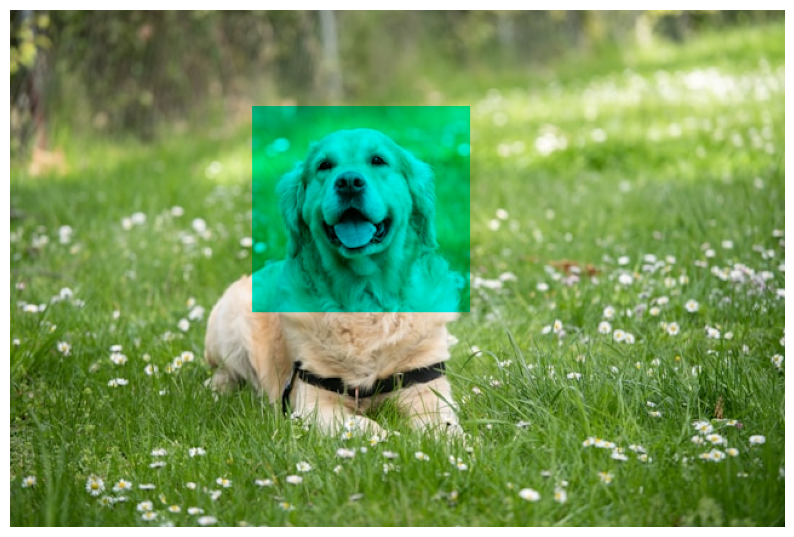

In [23]:
# Remove the red cannel from dog's face
RB_sq = np.copy(img_dog)
RB_sq[top:bottom, left:right, 2] = 0
fig, ax = plt.subplots(figsize=(10, 10))

ax.imshow(cv2.cvtColor(RB_sq, cv2.COLOR_BGR2RGB))
ax.axis('off')
plt.show()

## Histograms

In [24]:
img_munich = cv2.imread("munich.jpg",cv2.IMREAD_GRAYSCALE)

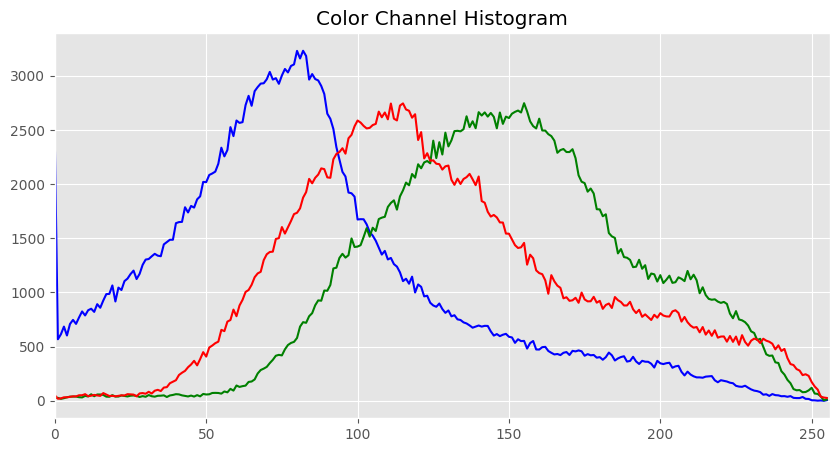

In [25]:
plt.figure(figsize=(10,5))

for i, col in enumerate(['b', 'g', 'r']):
    hist = cv2.calcHist([img_dog], [i], None, [256], [0, 256])
    plt.plot(hist, color = col)
    plt.xlim([0, 256])
    
plt.title("Color Channel Histogram")
plt.show()


## Gray Scale Histograms 

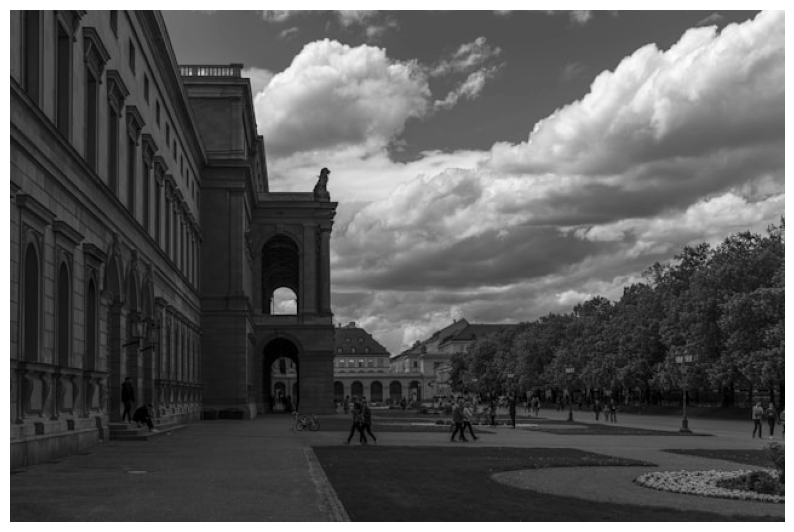

In [26]:
fig, ax = plt.subplots(figsize=(10, 10))
ax.imshow(img_munich, cmap='grey')
ax.axis('off')
plt.show()

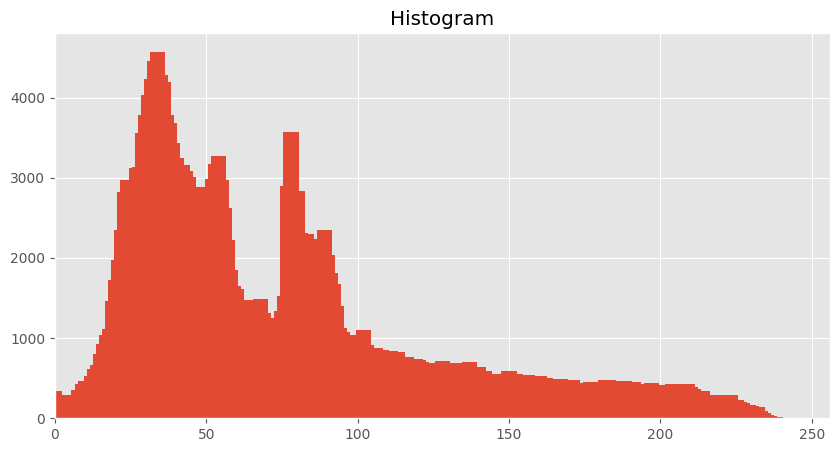

In [27]:
plt.figure(figsize=(10,5))
hist = cv2.calcHist([img_munich],[0], None, [256], [0, 256])
intensity_values = np.array([x for x in range(hist.shape[0])])
plt.bar(intensity_values, hist[:,0], width = 5)
plt.title("Histogram")
plt.xlim([0, 256])
plt.show()

## Image Negatives

This formula describes a method for generating negative colors. Typically, colors are represented by three channels: red, green, and blue (RGB), each ranging from 0 to 255. 
$$
g(x,y)=255-f(x,y)
$$

In this formula:
- g(x, y)  represents the new color value after applying the negative transformation.
-  f(x, y)  represents the original color value.


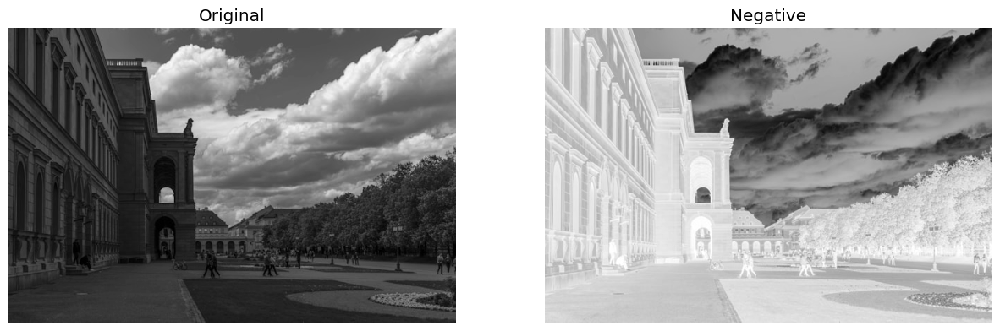

In [28]:
fig, axs = plt.subplots(1, 2, figsize=(15, 5))
axs[0].imshow(img_munich, cmap='gray')
axs[1].imshow(255 - img_munich , cmap='gray')
axs[0].axis('off')
axs[1].axis('off')
axs[0].set_title('Original')
axs[1].set_title('Negative')
plt.show()

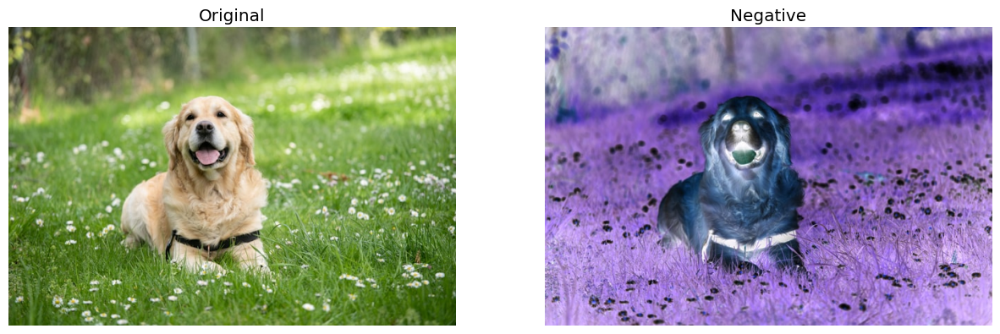

In [29]:
fig, axs = plt.subplots(1, 2, figsize=(15, 5))
axs[0].imshow(cv2.cvtColor(img_dog, cv2.COLOR_BGR2RGB))
axs[1].imshow(cv2.cvtColor(255 - img_dog, cv2.COLOR_BGR2RGB))
axs[0].axis('off')
axs[1].axis('off')
axs[0].set_title('Original')
axs[1].set_title('Negative')
plt.show()

## Brightness and contrast

To adjust the brightness and contrast of an image using intensity transformation, we utilize the formulas:

1. **Brightness Control**: We improve brightness by adding a constant value, denoted by $\beta$, to each pixel in the image.

2. **Contrast Control**: Contrast is controlled by multiplying each pixel value by a factor, denoted by $\alpha$.

The transformed image $g(x, y)$ is obtained from the original image $f(x, y)$ using the formula </br></br>


<font size="+0.5"><center> $g(x, y) = \alpha \cdot f(x, y) + \beta$ </center></font>

In this transformation:
- $\alpha$ adjusts the contrast. Higher values increase contrast, while lower values decrease it.
- $\beta$ adjusts the brightness. Positive values make the image brighter, while negative values make it darker.


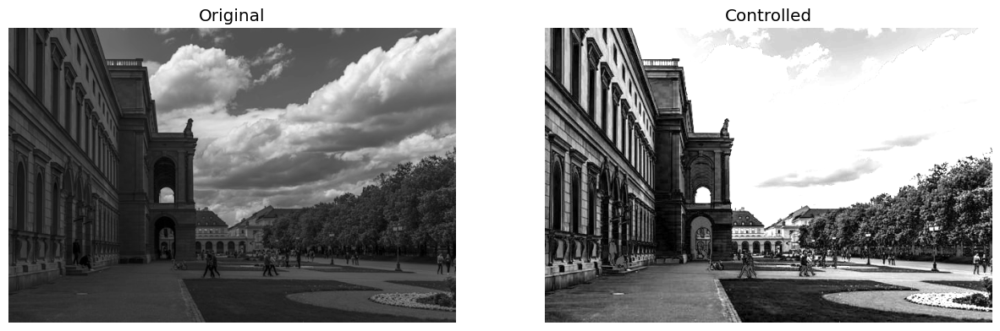

In [30]:
alpha = 4
beta = -100
controlled = cv2.convertScaleAbs(img_munich, alpha=alpha, beta=beta)

fig, axs = plt.subplots(1, 2, figsize=(15, 5))
axs[0].imshow(img_munich, cmap="gray")
axs[1].imshow(controlled, cmap="gray")
axs[0].axis('off')
axs[1].axis('off')
axs[0].set_title('Original')
axs[1].set_title('Controlled')
plt.show()

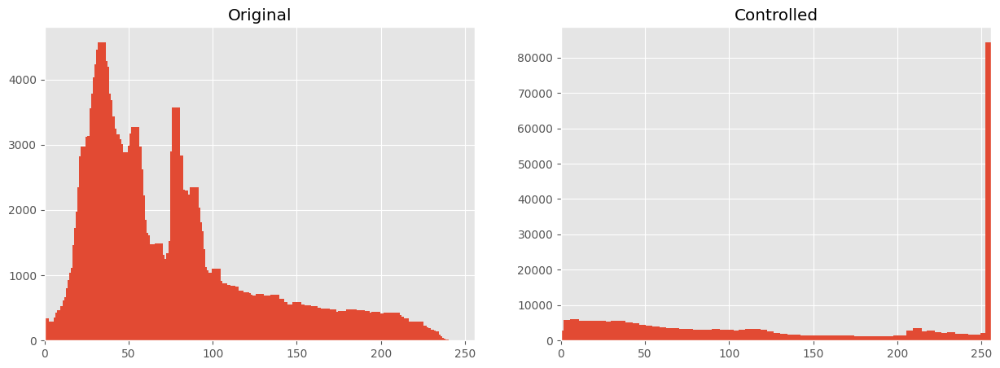

In [31]:
hist = cv2.calcHist([img_munich],[0], None, [256], [0, 256])
intensity_values = np.array([x for x in range(hist.shape[0])])
fig, axs = plt.subplots(1, 2, figsize=(15, 5))
axs[0].bar(intensity_values, hist[:,0], width = 5)
axs[0].set_title("Original")
axs[0].set_xlim([0, 256])


hist = cv2.calcHist([controlled],[0], None, [256], [0, 256])
intensity_values = np.array([x for x in range(hist.shape[0])])
axs[1].bar(intensity_values, hist[:,0], width = 5)
axs[1].set_title("Controlled")
axs[1].set_xlim([0, 256])
plt.show()

## Histogram Equalization

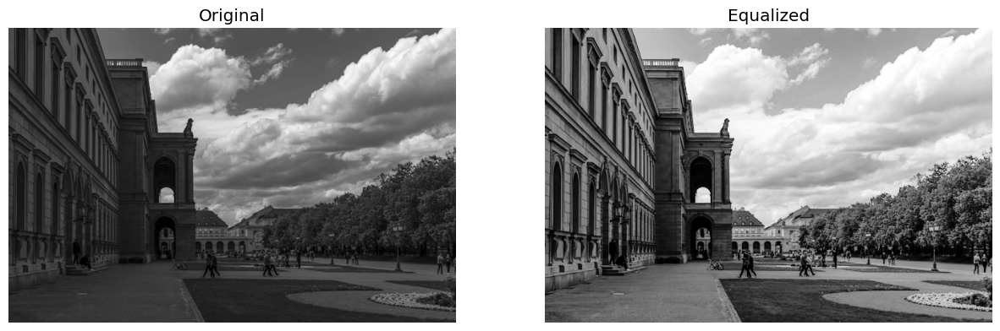

In [32]:
equalized = cv2.equalizeHist(img_munich)

fig, axs = plt.subplots(1, 2, figsize=(15, 5))
axs[0].imshow(img_munich, cmap="gray")
axs[1].imshow(equalized, cmap="gray")
axs[0].axis('off')
axs[1].axis('off')
axs[0].set_title('Original')
axs[1].set_title('Equalized')
plt.show()

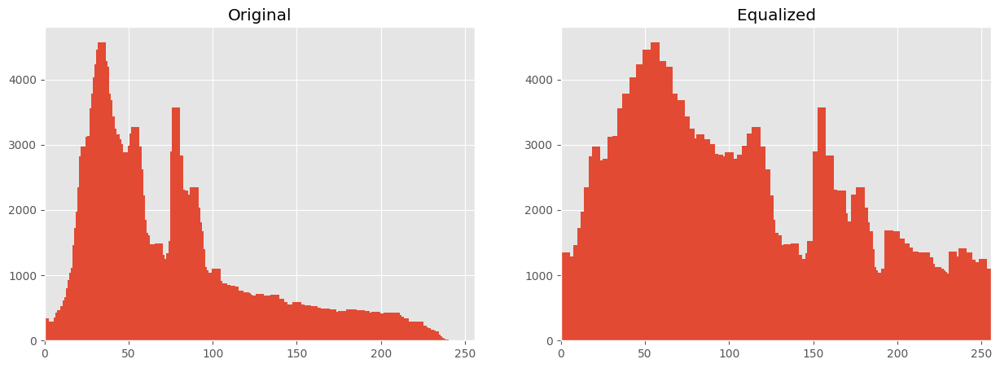

In [33]:
hist = cv2.calcHist([img_munich],[0], None, [256], [0, 256])
intensity_values = np.array([x for x in range(hist.shape[0])])
fig, axs = plt.subplots(1, 2, figsize=(15, 5))
axs[0].bar(intensity_values, hist[:,0], width = 5)
axs[0].set_title("Original")
axs[0].set_xlim([0, 256])


hist = cv2.calcHist([equalized],[0], None, [256], [0, 256])
intensity_values = np.array([x for x in range(hist.shape[0])])
axs[1].bar(intensity_values, hist[:,0], width = 5)
axs[1].set_title("Equalized")
axs[1].set_xlim([0, 256])

plt.show()

## Thresholding

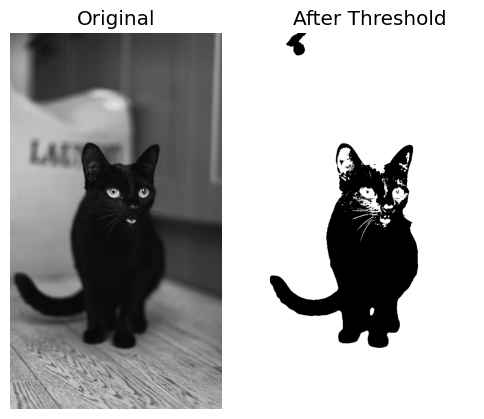

25.0

In [34]:
img_cat = cv2.imread("cat.png", cv2.IMREAD_GRAYSCALE)


ret, thresh = cv2.threshold(img_cat, 25, 255, cv2.THRESH_BINARY) # 'THRESH_TRUNC'  will not change the values if the 
                                                                 #  pixels are less than the threshold value

fig, axs = plt.subplots(1, 2, figsize=(6, 5))
axs[0].imshow(img_cat, cmap="gray")
axs[1].imshow(thresh, cmap="gray")
axs[0].axis('off')
axs[1].axis('off')
axs[0].set_title('Original')
axs[1].set_title('After Threshold')
plt.show()

ret

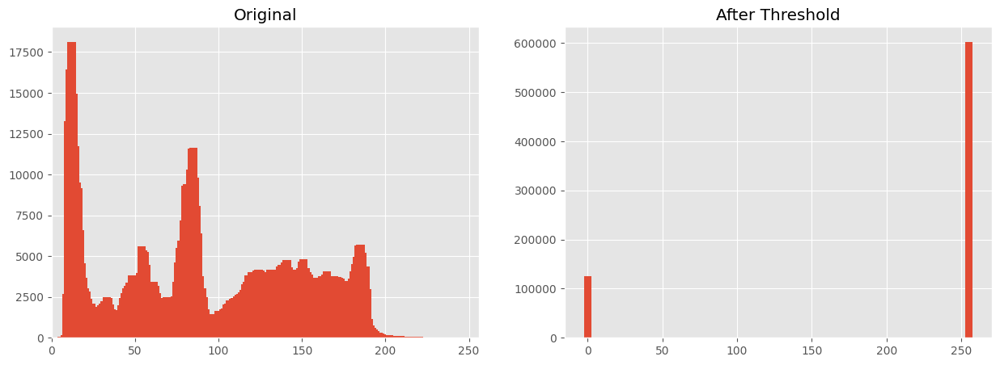

In [35]:
hist = cv2.calcHist([img_cat],[0], None, [256], [0, 256])
intensity_values = np.array([x for x in range(hist.shape[0])])
fig, axs = plt.subplots(1, 2, figsize=(15, 5))
axs[0].bar(intensity_values, hist[:,0], width = 5)
axs[0].set_title("Original")
axs[0].set_xlim([0, 256])


hist = cv2.calcHist([thresh],[0], None, [256], [0, 256])
intensity_values = np.array([x for x in range(hist.shape[0])])
axs[1].bar(intensity_values, hist[:,0], width = 5)
axs[1].set_title("After Threshold")

plt.show()

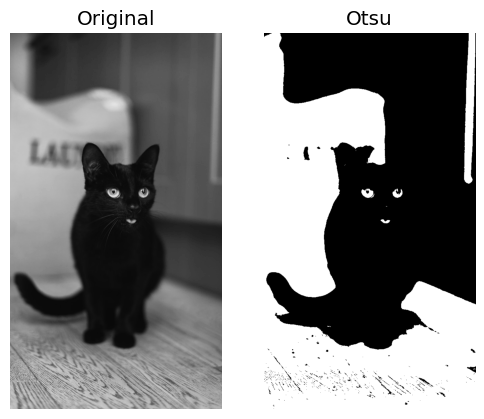

99.0

In [36]:
# Otsu's method will automatically choose the threshold
ret, otsu = cv2.threshold(img_cat, 0, 255, cv2.THRESH_OTSU)

fig, axs = plt.subplots(1, 2, figsize=(6, 5))
axs[0].imshow(img_cat, cmap="gray")
axs[1].imshow(otsu, cmap="gray")
axs[0].axis('off')
axs[1].axis('off')
axs[0].set_title('Original')
axs[1].set_title('Otsu')
plt.show()

ret

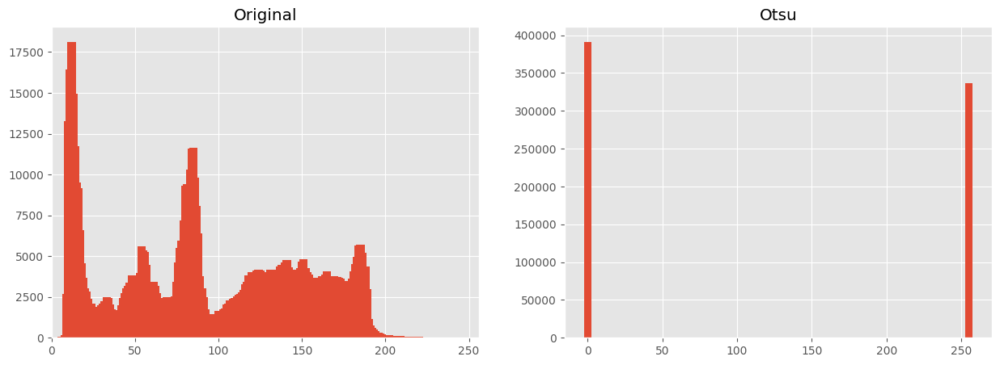

In [37]:
hist = cv2.calcHist([img_cat],[0], None, [256], [0, 256])
intensity_values = np.array([x for x in range(hist.shape[0])])
fig, axs = plt.subplots(1, 2, figsize=(15, 5))
axs[0].bar(intensity_values, hist[:,0], width = 5)
axs[0].set_title("Original")
axs[0].set_xlim([0, 256])


hist = cv2.calcHist([otsu],[0], None, [256], [0, 256])
intensity_values = np.array([x for x in range(hist.shape[0])])
axs[1].bar(intensity_values, hist[:,0], width = 5)
axs[1].set_title("Otsu")

plt.show()

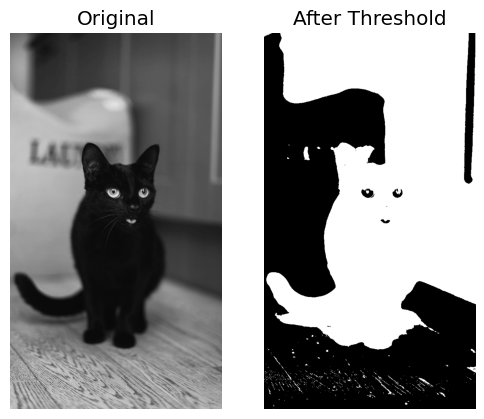

In [38]:
img_cat = cv2.imread("cat.png", cv2.IMREAD_GRAYSCALE)

ret, outs = cv2.threshold(src = img_cat, thresh = 25, maxval = 255, type = cv2.THRESH_OTSU+cv2.THRESH_BINARY_INV)

fig, axs = plt.subplots(1, 2, figsize=(6, 5))
axs[0].imshow(img_cat, cmap="gray")
axs[1].imshow(outs, cmap="gray")
axs[0].axis('off')
axs[1].axis('off')
axs[0].set_title('Original')
axs[1].set_title('After Threshold')
plt.show()

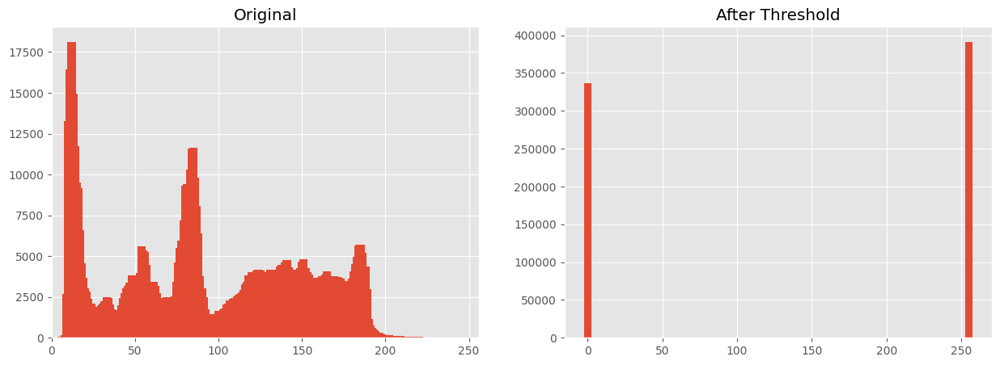

In [39]:
hist = cv2.calcHist([img_cat],[0], None, [256], [0, 256])
intensity_values = np.array([x for x in range(hist.shape[0])])
fig, axs = plt.subplots(1, 2, figsize=(15, 5))
axs[0].bar(intensity_values, hist[:,0], width = 5)
axs[0].set_title("Original")
axs[0].set_xlim([0, 256])


hist = cv2.calcHist([outs],[0], None, [256], [0, 256])
intensity_values = np.array([x for x in range(hist.shape[0])])
axs[1].bar(intensity_values, hist[:,0], width = 5)
axs[1].set_title("After Threshold")

plt.show()

## Scaling

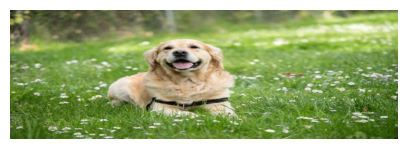

In [40]:
fig, ax = plt.subplots(figsize=(5, 5))

scaled = cv2.resize(img_dog, None, fx=2, fy=1, interpolation=cv2.INTER_CUBIC) # We can use INTER_NEAREST to use the nearest pixel

ax.imshow(cv2.cvtColor(scaled, cv2.COLOR_BGR2RGB))
ax.axis('off')
plt.show()

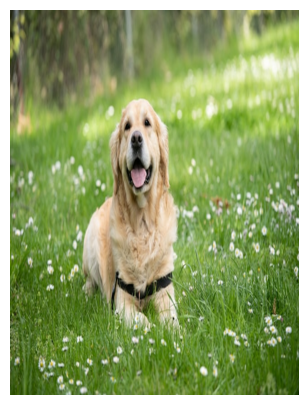

In [41]:
fig, ax = plt.subplots(figsize=(5, 5))

scaled = cv2.resize(img_dog, None, fx=1, fy=2, interpolation=cv2.INTER_CUBIC) # We can use INTER_NEAREST to use the nearest pixel

ax.imshow(cv2.cvtColor(scaled, cv2.COLOR_BGR2RGB))
ax.axis('off')
plt.show()

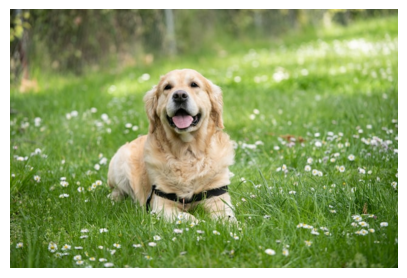

Original size: (427, 640, 3)
Size after scaling: (854, 1280, 3)


In [42]:
# Scaling both vertically and horizontally
fig, ax = plt.subplots(figsize=(5, 5))

scaled = cv2.resize(img_dog, None, fx=2, fy=2, interpolation=cv2.INTER_CUBIC) # We can use INTER_NEAREST to use the nearest pixel

ax.imshow(cv2.cvtColor(scaled, cv2.COLOR_BGR2RGB))
ax.axis('off')
plt.show()

print(f"Original size: {img_dog.shape}\nSize after scaling: {scaled.shape}")

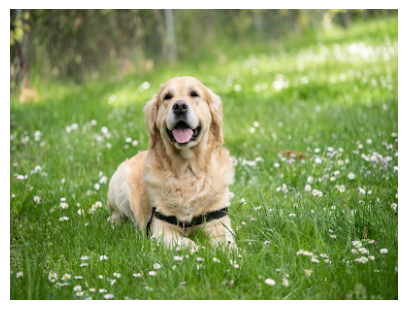

Original size: (427, 640, 3)
Size after scaling: (300, 400, 3)


In [43]:
# Scaling by specifing rows and columns
fig, ax = plt.subplots(figsize=(5, 5))

scaled = cv2.resize(img_dog, (400, 300), interpolation=cv2.INTER_CUBIC) # We can use INTER_NEAREST to use the nearest pixel

ax.imshow(cv2.cvtColor(scaled, cv2.COLOR_BGR2RGB))
ax.axis('off')
plt.show()

print(f"Original size: {img_dog.shape}\nSize after scaling: {scaled.shape}")

## Kernels
https://en.wikipedia.org/wiki/Kernel_(image_processing)

## Sharpen

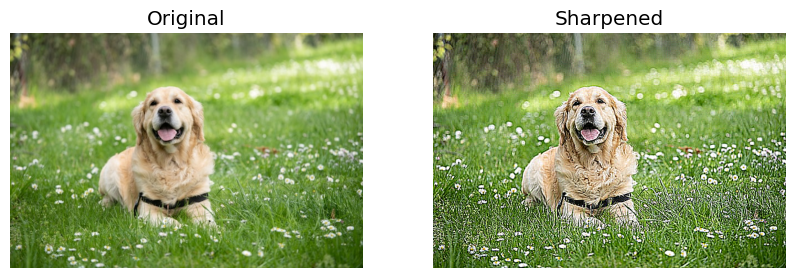

In [44]:
kernel_sharpening = np.array([[-1,-1,-1], 
                              [-1,9,-1], 
                              [-1,-1,-1]])

sharpened = cv2.filter2D(img_dog, -1, kernel_sharpening)

fig, axs = plt.subplots(1, 2, figsize=(10, 5))
axs[0].imshow(cv2.cvtColor(img_dog, cv2.COLOR_BGR2RGB))
axs[1].imshow(cv2.cvtColor(sharpened, cv2.COLOR_BGR2RGB))
axs[0].axis('off')
axs[1].axis('off')
axs[0].set_title('Original')
axs[1].set_title('Sharpened')
plt.show()

## Blur

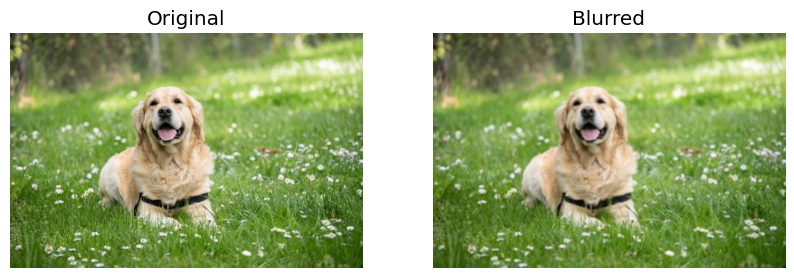

In [45]:
kernel_3x3 = np.ones((3, 3), np.float32) / 9
blurred = cv2.filter2D(img_dog, -1, kernel_3x3)

fig, axs = plt.subplots(1, 2, figsize=(10, 5))
axs[0].imshow(cv2.cvtColor(img_dog, cv2.COLOR_BGR2RGB))
axs[1].imshow(cv2.cvtColor(blurred, cv2.COLOR_BGR2RGB))
axs[0].axis('off')
axs[1].axis('off')
axs[0].set_title('Original')
axs[1].set_title('Blurred')
plt.show()

## Median Blur

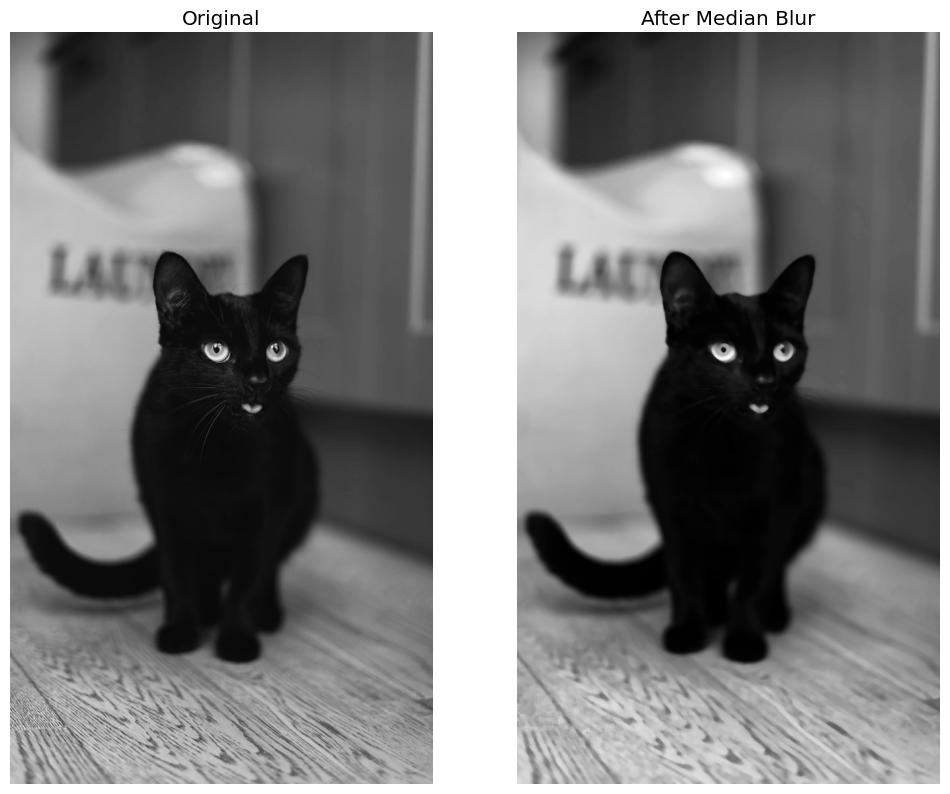

In [46]:
filtered_image = cv2.medianBlur(img_cat, 7)


fig, axs = plt.subplots(1, 2, figsize=(12, 12))
axs[0].imshow(img_cat, cmap="gray")
axs[1].imshow(filtered_image, cmap="gray")
axs[0].axis('off')
axs[1].axis('off')
axs[0].set_title('Original')
axs[1].set_title('After Median Blur')
plt.show()

## Edge Detection

Apply the Sobel filter to compute the gradient in the X direction, highlighting Horizontal edges in the image

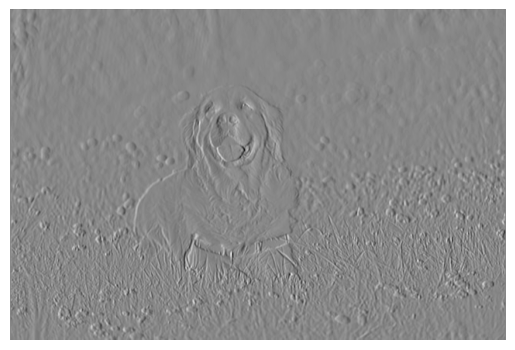

In [47]:
grad_x = cv2.Sobel(src=cv2.cvtColor(img_dog, cv2.COLOR_BGR2GRAY), ddepth=cv2.CV_16S, dx=1, dy=0, ksize=3)
plt.imshow(grad_x,cmap='gray')
plt.axis('off')
plt.show()

Apply the Sobel filter to compute the gradient in the Y direction, highlighting vertical edges in the image

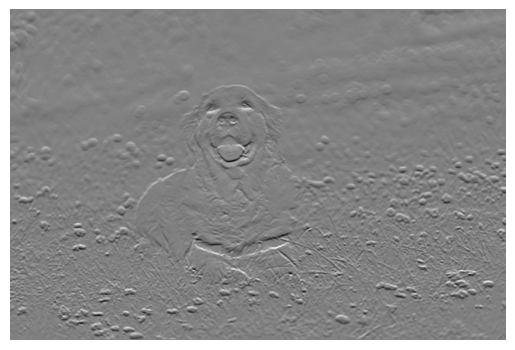

In [48]:
grad_y = cv2.Sobel(src=cv2.cvtColor(img_dog, cv2.COLOR_BGR2GRAY), ddepth=cv2.CV_16S, dx=0, dy=1, ksize=3)
plt.imshow(grad_y,cmap='gray')
plt.axis('off')
plt.show()

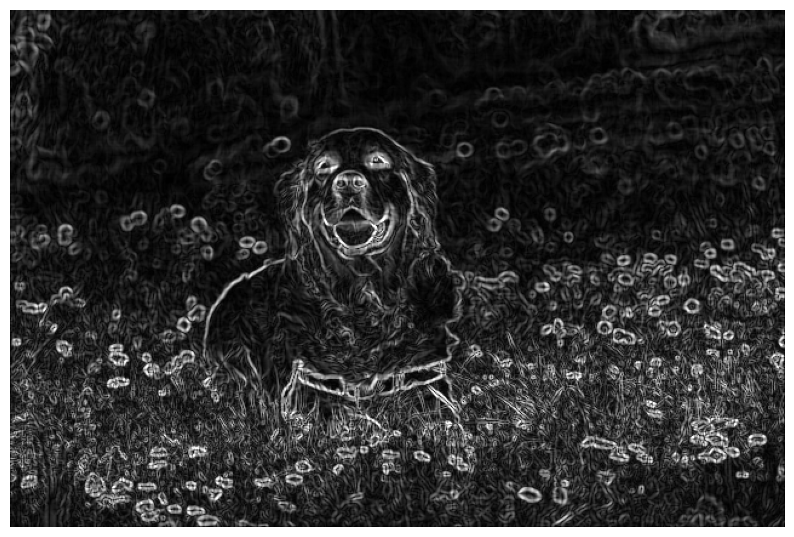

In [49]:
# Convert the gradient images along the X and Y directions to unsigned 8-bit integers,
# ensuring all gradient values are positive and suitable for further processing.
abs_grad_x = cv2.convertScaleAbs(grad_x)
abs_grad_y = cv2.convertScaleAbs(grad_y)

# Combine the absolute gradient images with equal weighting to approximate the overall gradient magnitude.
grad = cv2.addWeighted(abs_grad_x, 0.5, abs_grad_y, 0.5, 0)

plt.figure(figsize=(10,10))
plt.imshow(grad,cmap='gray')
plt.axis('off')
plt.show()